# Stochastic stranding
__Суммарное количество баллов: 8__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[HSE][ML][HW11] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

По бескрайним каменным джунглям от заказа к заказу бродят курьеры. Их задача - как можно быстрее доставить все заказы, чтобы взять новые. Ничто не может заставить их покинуть вечный цикл доставки.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import copy

In [2]:
def get_colors(distances, alpha=True):
    normed = np.array(distances) - np.min(distances)
    normed = normed / np.max(normed)
    alpha = 1/np.mean([len(row) for row in normed])**0.5 if alpha else 1.
    return [[((1. if n > 0.5 else 2 * n), (1. if n < 0.5 else 2 - 2*n), 0., alpha) 
             for n in row] for row in normed]

def get_coords(points):
    results = []
    for pts in points:
        x_prev, _ = pts[0]
        result = [pts[0]]
        for x, y in list(pts[1:]) + [pts[0]]:
            result.append((x_prev, y))
            result.append((x, y))
            x_prev = x
        results.append(list(zip(*result)))
    return results

def init_figure(X):
    upper_bound, lower_bound = X.max(axis=0) + 1, X.min(axis=0) - 1
    fig, ax = plt.subplots(figsize=(10, 10), nrows=1, ncols=1)
    #ax.set_facecolor((0.1, 0.1, 0.1))
    ax.grid(True)
    #ax.grid(True, color=(0.9, 0.9, 0.9))
    ax.set_xticks(range(lower_bound[0], upper_bound[0]))
    ax.set_yticks(range(lower_bound[1], upper_bound[1]))
    ax.set_xlim(lower_bound[0], upper_bound[0])
    ax.set_ylim(lower_bound[1], upper_bound[1])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.scatter(X[:, 0], X[:, 1], color=(0, 0, 1))
    plt.tight_layout()
    return fig, ax    

def visualize_hillclimb(X, hillclimb):
    fig, ax = init_figure(X)
    permutations = hillclimb.optimize_explain(X)
    colors = get_colors([[cyclic_distance(X[p], hillclimb.dist) for p in permutations]], False)[0]
    coords = get_coords([X[p] for p in permutations])
    plot = ax.plot(coords[0][0], coords[0][1], color=colors[0])[0]
    
    def animate(i):
        plot.set_color(colors[i])
        plot.set_data(*coords[i])
        return (plot,)
    
    return animation.FuncAnimation(fig, animate, frames=len(permutations), interval=100, blit=True)

def visualize_genetic(X, genetic):
    fig, ax = init_figure(X)
    populations = genetic.optimize_explain(X)
    distances = [[cyclic_distance(X[p], genetic.dist) for p in populations[i]] for i in range(len(populations))]
    colors = get_colors(distances)
    coords = get_coords([X[p] for p in populations[0]])
    plots = [ax.plot(x, y, color=c)[0] for (x, y), c in zip(coords, colors[0])]
    best_id = np.argmin(distances[0])
    best_plot = ax.plot(*coords[best_id], color=(0.3, 0.3, 1, 0.9), linestyle="-.")[0]
    
    def animate(i):
        coords = get_coords([X[p] for p in populations[i]])
        for p, (x, y), c in zip(plots, coords, colors[i]):
            p.set_color(c)
            p.set_data(x, y)
        best_id = np.argmin(distances[i])
        best_plot.set_data(*coords[best_id])
        return plots + [best_plot]
    
    return animation.FuncAnimation(fig, animate, frames=len(populations), interval=100, blit=True)

In [3]:
def synthetic_points(count=25, dims=2):
    return np.random.randint(40, size=(count, dims))

X = synthetic_points()

### Задание 1 (1 балл)
Для начала научимся считать расстояния, которые курьерам придется преодолеть. Если бы они доставляли еду в пустыне, то им бы было достаточно считать евклидовы расстояния, т.к. можно просто идти напрямик. Однако курьеры доставляют еду только в городе, и двигаться могут только вдоль улиц. Поэтому нам понадобится манъэттенское расстояние.

#### Функции
`cyclic_distance(points, dist)` - возвращает суммарное расстояние пройденное курьером по циклу из точек `points` посчитанное при помощи функции `dist`.

`l2_distance(p1, p2)` - возвраает евклидово расстояние между точками.

`l1_distance(p1, p2)` - возвращает манхэттенское расстояние между точками.

In [4]:
def cyclic_distance(points, dist):
    current_distance = 0
    points = iter(points)
    first_point = next(points)
    prev_point = first_point
    for point in points:
        current_distance += dist(prev_point, point)
        prev_point = point
    return current_distance + dist(prev_point, first_point)

def l2_distance(p1, p2):
    return np.sqrt(sum(((p2_i - p1_i)**2 for (p1_i, p2_i) in zip(p1, p2))))

def l1_distance(p1, p2):
    return sum((np.abs(p2_i - p1_i) for (p1_i, p2_i) in zip(p1, p2)))

### Задание 2 (3 балла)
Курьер получил карту расположения заказов на карте. Ему хочется побыстрее обойти все точки. Для этого он хочет воспользоваться методом HillClimb, а вам предстоит ему в этом помочь. Реализуйте данный метод.

#### Методы
`optimize_explain(X)` - возвращает список из перестановок точек `X`, полученных в процессе оптимизации. Перестановка должна попадать в список после каждого изменения. Метод должен совершить не больше `max_iterations` итераций, на каждой из них необходимо рассмотреть все возможные пары индексов.

#### Параметры конструктора
`max_iterations` - максимальное количество итераций в методе `optimize_explain`

`dist` - функция расстояния

In [5]:
class HillClimb:
    def __init__(self, max_iterations, dist):
        self.max_iterations = max_iterations
        self.dist = dist # Do not change
    
    def optimize(self, X):
        return self.optimize_explain(X)[-1]

    def optimize_explain(self, X):
        def get_distance(i, j):
            return distances[inds[max(i, 0)], inds[min(j, len(X) - 1)]]

        # pre-calculate all distances between points
        distances = np.zeros(shape=(len(X), len(X)))
        for i in range(len(X) - 1):
            for j in range(i, len(X)):
                distances[i, j] = self.dist(X[i], X[j])
                distances[j, i] = distances[i, j]

        # shuffle X by creating an array of indices
        inds = np.random.permutation(len(X))
        all_permutations = [inds.copy()]

        # perform at most `max_iterations` swaps
        for _ in range(self.max_iterations):
            # check all possible swaps
            best_decrease = None
            transform_type = None
            i_best, j_best = None, None
            for i in range(len(X) - 1):  # i < j
                cur_distances = [get_distance(i - 1, i), get_distance(i, i + 1), None, None]
                for j in range(i + 1, len(X)):
                    cur_distances[2] = get_distance(max(j - 1, i + 1), j)
                    cur_distances[3] = get_distance(j, j + 1)
                    new_distances = [
                        get_distance(i - 1, j),
                        get_distance(j, i + 1),  # 0 if j == i + 1
                        get_distance(j - 1 if i != j - 1 else j, i),
                        get_distance(i, j + 1)
                    ]

                    # compare distances
                    decrease = sum(cur_distances) - sum(new_distances)
                    if decrease > 0 and (best_decrease is None or decrease > best_decrease):
                        best_decrease = decrease
                        i_best, j_best = i, j
                        transform_type = 'swap'
            
                    # try inverting the interval
                    decrease = (cur_distances[0] + cur_distances[3]
                                - new_distances[0] - new_distances[3])
                    if decrease > 0 and (best_decrease is None or decrease > best_decrease):
                        best_decrease = decrease
                        i_best, j_best = i, j
                        transform_type = 'invert'
            
            # swap points for maximum distance decrease
            if transform_type is None:  # no good swaps
                break
            if transform_type == 'swap':
                inds[i_best], inds[j_best] = inds[j_best], inds[i_best]
            else:
                assert transform_type == 'invert'
                inds[i_best:j_best + 1] = inds[i_best:j_best + 1][::-1]
            all_permutations.append(copy.copy(inds))

        return all_permutations


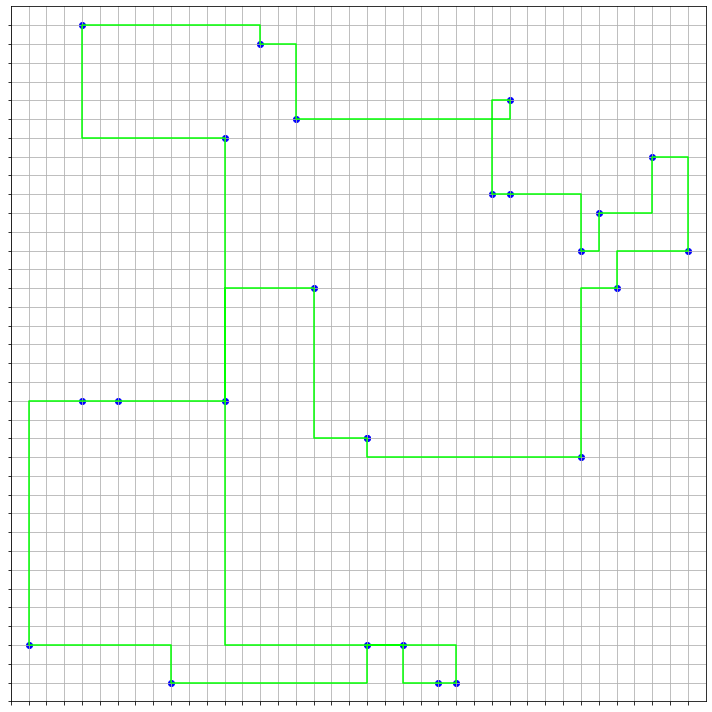

In [6]:
hc = HillClimb(100, l1_distance)
HTML(visualize_hillclimb(X, hc).to_jshtml())

### Задание 3 (4 балла)
Курьерское дело растет, теперь между городами блуждает большое количество курьеров, а их профессия вместе с известным маршрутом передается из поколение в поколение. Чем быстрее курьер способен обойти города - тем больше вероятность того, что он заработает себе на безоблачную старость и передаст свое дело потомкам. Симулируйте эволюцию курьеров, реализовав генетический алгоритм.

#### Методы
`optimize(X)` - выбирает лучшую перестановку из результатов `optimize_explain(X)`

`optimize_explain(X)` - возвращает список длины `iterations` популяций размера `population` перестановок точек `X`, полученных в процессе оптимизации. На каждом шаге алгоритм должен оставлять только `survivors` выживших, следующая популяция должна быть сгенерирована из них

In [7]:
class Genetic:
    def __init__(self, iterations, population, survivors, distance):
        self.pop_size = population
        self.surv_size = survivors
        self.dist = distance
        self.iters = iterations

    def _distance(self, points):
        return cyclic_distance(points, self.dist)

    def _selection(self, population, distances):
        survivor_inds = np.argpartition(distances, kth=self.surv_size - 1)
        return [population[i] for i in survivor_inds[:self.surv_size]]

    def _crossover(self, population, min_frac):
        num_genes = len(population[0])
        new_population = []
        for _ in range(self.pop_size):
            # get two parents
            p1 = np.random.choice(range(self.surv_size))
            parent_1 = population[p1]
            p2 = p1
            while p2 == p1:
                p2 = np.random.choice(range(self.surv_size))
            parent_2 = population[p2]

            # split parents' genes between children
            fraction = min_frac + np.random.random() / (1 - min_frac * 2)
            n = int(round(fraction * num_genes))      # number of genes from parent_1 in child_1
            child = list(parent_1[:n])
            used = np.zeros(num_genes, dtype='bool')  # genes from parent_1 in child_1
            used[np.asarray(parent_1[:n])] = True
            for ind in parent_2:
                if not used[ind]:
                    child.append(ind)
            new_population.append(np.array(child))
        return new_population

    def _mutate(self, candidate, mutations=1):
        for _ in range(mutations):
            i, j = np.random.choice(candidate, 2)
            candidate[i], candidate[j] = candidate[j], candidate[i]
        return candidate

    def optimize(self, X):
        evolution = self.optimize_explain(X)
        best_candidate = None
        best_distance = np.inf
        for population in evolution:
            distances = [cyclic_distance(X[ind], self.dist) for ind in population]
            i = np.argmin(distances)
            distance = distances[i]
            if distance < best_distance:
                best_distance = distance
                best_candidate = population[i]
        return best_candidate

    def optimize_explain(self, X, parent_min_fraction=10.0, num_mutations=1):
        # generate random initial population
        population = [np.random.permutation(len(X)) for _ in range(self.pop_size)]
        evolution = [population]

        # generate new populations
        for _ in range(self.iters):
            distances = [cyclic_distance(X[inds], self.dist) for inds in population]
            population = self._selection(population, distances)  # pop_size -> surv_size
            population = self._crossover(population, parent_min_fraction)
            population = [self._mutate(candidate, num_mutations) for candidate in population]
            evolution.append(population)

        return evolution

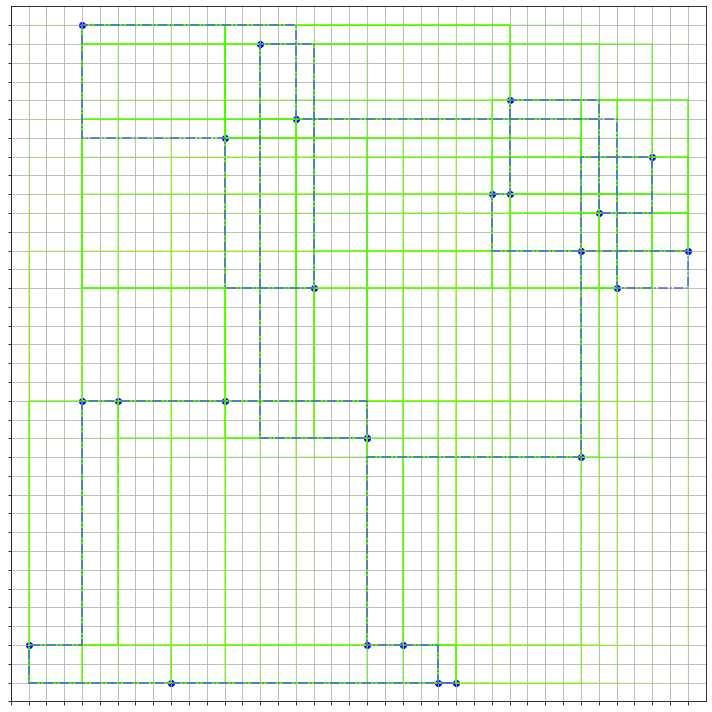

In [8]:
gen = Genetic(200, 100, 20, l1_distance)
HTML(visualize_genetic(X, gen).to_jshtml())